In [2]:
import numpy as np
import cv2
import os
from tensorflow.keras.utils import Progbar
import sys
from skimage.io import imread, imshow, imread_collection, concatenate_images
from skimage.transform import resize
from skimage.morphology import label

%matplotlib inline
import matplotlib.pyplot as plt

import imgaug as ia
import imgaug.augmenters as iaa

import tensorflow as tf
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras.layers import Input, Dropout, Lambda, Conv2D, Conv2DTranspose,Convolution2D, MaxPooling2D, concatenate, Flatten, Dense, GlobalAveragePooling2D
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.metrics import MeanIoU
import pandas as pd
from tensorflow.keras.callbacks import History

import os 

os.environ["CUDA_VISIBLE_DEVICES"] = "3"

physical_devices = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental_run_functions_eagerly(True)
tf.config.experimental.set_memory_growth(physical_devices[0], enable=True)
import multiprocessing

ModuleNotFoundError: No module named 'cv2'

In [5]:
 tf.config.experimental.list_physical_devices('GPU')[0]

PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')

In [6]:
os.listdir()


['.local',
 '.config',
 'smote_x.npy',
 'test.h5',
 '.bash_history',
 '.conda',
 '.ipynb_checkpoints',
 'smote_y.npy',
 'models',
 '.jupyter',
 '.bashrc',
 'others',
 'Classify Uncropped.ipynb',
 'Untitled.ipynb',
 'aug_train.h5',
 '.profile',
 '.ipython',
 '.keras',
 'Classification_cropped_balanced.ipynb',
 'data',
 '.nv',
 '.bash_logout',
 '.cache']

In [4]:
collection = [
]

collection = './data/uncropped/DermNet'


ids_train = []
ids_test = []

label_train = []
label_test = []

counter = 0

for i in os.listdir(collection):
    for j in os.listdir(collection + '/' + i + '/'):
        for k in os.listdir(collection + '/' + i + '/' + j + '/'):
            if(counter % 9 != 0):  
                ids_train.append(collection + '/' + i + '/' + j + "/" + k)
                label_train.append(i)
            else:
                ids_test.append(collection + '/' + i + '/' + j + "/" + k)
                label_test.append(i)
            
        counter += 1


In [26]:
ids_test[0]

'./data/uncropped/DermNet/exanthems/Unilateral-Laterothoracic-Exanthem/unilateral-laterothoracic-exanthem-3.jpg'

In [3]:
print(np.unique(label_train))
print(np.unique(label_test))


['acne_ros' 'actinic' 'atopic' 'bullous' 'c_impetigo' 'eczema' 'exanthems'
 'herpes' 'light_disease' 'lupus' 'p_contact' 'psoriasis' 'scabies'
 'systemic' 'tinea' 'u_hives' 'vasculitis' 'warts']
['acne_ros' 'actinic' 'atopic' 'bullous' 'c_impetigo' 'eczema' 'exanthems'
 'herpes' 'light_disease' 'lupus' 'p_contact' 'psoriasis' 'scabies'
 'systemic' 'tinea' 'u_hives' 'vasculitis' 'warts']


In [5]:
print(len(label_train))
print(len(label_test))

14550
2443


In [6]:
IMG_WIDTH=224
IMG_HEIGHT=224

In [7]:
# Function read train images and mask return as nump array
def read_train_data(filenames,IMG_WIDTH=IMG_WIDTH,IMG_HEIGHT=IMG_HEIGHT,IMG_CHANNELS=3):

  
    
    X_train = np.zeros((len(filenames) , IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)

    print('Getting and resizing train images and masks ... ')
    sys.stdout.flush()

    a = Progbar(len(filenames))
    
    counter = 0
    
    for n in range(len(filenames)):
    #def mask(n):


        img = imread(filenames[n])[:,:,:IMG_CHANNELS]
        img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True).astype(np.uint8)

        X_train[counter] = img 
        

        
        a.update(n)
        counter += 1



    return X_train

In [8]:
# Function read train images and mask return as nump array
def read_valid_data(filenames,IMG_WIDTH=IMG_WIDTH,IMG_HEIGHT=IMG_HEIGHT,IMG_CHANNELS=3):

  
    
    X_train = np.zeros((len(filenames) , IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)

    print('Getting and resizing train images and masks ... ')
    sys.stdout.flush()

    a = Progbar(len(filenames))
    
    counter = 0
    
    for n in range(len(filenames)):
    #def mask(n):


        img = imread(filenames[n])[:,:,:IMG_CHANNELS]
        img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True).astype(np.uint8)

        X_train[counter] = img 
        

        
        a.update(n)
        counter += 1



    return X_train

In [9]:
train_orig = read_train_data(ids_train)

Getting and resizing train images and masks ... 
14549/14550 [============================>.] - ETA: 0s

In [10]:
valid_orig = read_valid_data(ids_test)

Getting and resizing train images and masks ... 
2442/2443 [============================>.] - ETA: 0s

In [11]:
labels_encoded = pd.get_dummies(label_train)
y_train = labels_encoded.to_numpy()

valid_labels_encoded = pd.get_dummies(label_test)
y_test = valid_labels_encoded.to_numpy()

In [12]:
train_x = train_orig.reshape(train_orig.shape[0], 224*224*3)
print(train_x.shape)

(14550, 150528)


In [13]:
from imblearn.over_sampling import SMOTE
import gc
gc.collect()


sm = SMOTE(random_state=42, n_jobs=-1, sampling_strategy='all',  k_neighbors=4)
x_train, y_train = sm.fit_sample(train_x, y_train)
x_train = x_train.reshape(x_train.shape[0], 224, 224, 3)

Using TensorFlow backend.
/home/imtl/.conda/envs/imtl/lib/python3.8/site-packages/sklearn/utils/validation.py:68: FutureWarning: Pass classes=[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


In [14]:
np.save("./data/uncropped/smote_x.npy", x_train)
np.save("./data/uncropped/smote_y.npy", y_train)

In [3]:
x_train = np.load("./data/uncropped/smote_x.npy")
y_train = np.load("./data/uncropped/smote_y.npy")
x_train = x_train.reshape(x_train.shape[0], 224, 224, 3)

FileNotFoundError: [Errno 2] No such file or directory: './data/uncropped/smote_x.npy'

In [15]:
from tensorflow.keras.metrics import top_k_categorical_accuracy
def top_1_accuracy(y_true, y_pred):
    return top_k_categorical_accuracy(y_true, y_pred, k=1)

def top_2_accuracy(y_true, y_pred):
    return top_k_categorical_accuracy(y_true, y_pred, k=2)

def top_3_accuracy(y_true, y_pred):
    return top_k_categorical_accuracy(y_true, y_pred, k=3)

def top_4_accuracy(y_true, y_pred):
    return top_k_categorical_accuracy(y_true, y_pred, k=4)

def top_5_accuracy(y_true, y_pred):
    return top_k_categorical_accuracy(y_true, y_pred, k=5)

In [16]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard, ReduceLROnPlateau

path_checkpoint = './models/july4_uncropped_smote.keras'
callback_checkpoint = ModelCheckpoint(filepath=path_checkpoint,
                                      monitor='val_acc',
                                      verbose=1,
                                      save_weights_only=True,
                                      save_best_only=True)

In [17]:
history = History()
callbacks = [
             callback_checkpoint,
             
             #callback_reduce_lr,
             history,
             
             ]

In [18]:
import efficientnet.tfkeras as efn
def get_effnet():
    
    input_orig = Input((IMG_HEIGHT, IMG_WIDTH, 3))
    #input_hemo = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    #input_mela = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    #input_img = concatenate([input_orig, input_hemo, input_mela])
    
    s = Lambda(lambda x: x / 255) (input_orig)
    
    ee = efn.EfficientNetB4(weights='imagenet', include_top=False ,input_shape=(224,224,3))(s)
    
    #count += 1
    c6 = GlobalAveragePooling2D()(ee)
    
    #c7 = Dense(1024, activation='relu')(c6)
    #c7 = Dropout(0.5) (c7)

    #c8 = Dense(512, activation='relu')(c7)
    #c8 = Dropout(0.5) (c8)
    
    c8 = Dense(256, activation='relu')(c6)

    
    outputs = Dense(18, activation='softmax') (c8)  

    model = Model(inputs=[input_orig], outputs=[outputs])
    model.compile(optimizer=Adam(lr=1e-5),loss='categorical_crossentropy', metrics=['acc', top_5_accuracy])
    return model

In [19]:
model = get_effnet()

In [14]:
#path_checkpoint = './models/july2_uncropped.keras'

try:
    model.load_weights(path_checkpoint)  #filepath+'models/model2.keras'
except Exception as error:
    print("Error trying to load checkpoint.")
    print(error)

In [14]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
lambda (Lambda)              (None, 224, 224, 3)       0         
_________________________________________________________________
efficientnet-b4 (Model)      (None, 7, 7, 1792)        17673816  
_________________________________________________________________
global_average_pooling2d (Gl (None, 1792)              0         
_________________________________________________________________
dense (Dense)                (None, 256)               459008    
_________________________________________________________________
dense_1 (Dense)              (None, 18)                4626      
Total params: 18,137,450
Trainable params: 18,012,250
Non-trainable params: 125,200
___________________________________________

In [20]:
#Top 3
hist = model.fit(
      [x_train], y_train,
      epochs=50, 
      validation_data=([valid_orig] , y_test),    
      batch_size=24,
      callbacks=callbacks,
      shuffle=True,
      workers=8,
      use_multiprocessing=True,
)

Epoch 1/50
1717/1717 [==============================] - ETA: 0s - loss: 2.7529 - acc: 0.1440 - top_5_accuracy: 0.4674
Epoch 00001: val_acc improved from -inf to 0.18215, saving model to ./models/july4_uncropped_smote.keras
1717/1717 [==============================] - 1141s 665ms/step - loss: 2.7529 - acc: 0.1440 - top_5_accuracy: 0.4674 - val_loss: 2.6799 - val_acc: 0.1822 - val_top_5_accuracy: 0.4818
Epoch 2/50
1717/1717 [==============================] - ETA: 0s - loss: 2.4408 - acc: 0.2590 - top_5_accuracy: 0.6464
Epoch 00002: val_acc improved from 0.18215 to 0.19484, saving model to ./models/july4_uncropped_smote.keras
1717/1717 [==============================] - 1125s 655ms/step - loss: 2.4408 - acc: 0.2590 - top_5_accuracy: 0.6464 - val_loss: 2.6208 - val_acc: 0.1948 - val_top_5_accuracy: 0.5395
Epoch 3/50
1717/1717 [==============================] - ETA: 0s - loss: 2.1678 - acc: 0.3425 - top_5_accuracy: 0.7362
Epoch 00003: val_acc improved from 0.19484 to 0.21899, saving model t

Epoch 22/50
1717/1717 [==============================] - ETA: 0s - loss: 0.3026 - acc: 0.9041 - top_5_accuracy: 0.9941
Epoch 00022: val_acc did not improve from 0.28858
1717/1717 [==============================] - 1126s 656ms/step - loss: 0.3026 - acc: 0.9041 - top_5_accuracy: 0.9941 - val_loss: 3.7793 - val_acc: 0.2849 - val_top_5_accuracy: 0.5878
Epoch 23/50
1717/1717 [==============================] - ETA: 0s - loss: 0.2750 - acc: 0.9117 - top_5_accuracy: 0.9952
Epoch 00023: val_acc did not improve from 0.28858
1717/1717 [==============================] - 1119s 652ms/step - loss: 0.2750 - acc: 0.9117 - top_5_accuracy: 0.9952 - val_loss: 3.8777 - val_acc: 0.2824 - val_top_5_accuracy: 0.5841
Epoch 24/50
1717/1717 [==============================] - ETA: 0s - loss: 0.2528 - acc: 0.9200 - top_5_accuracy: 0.9964
Epoch 00024: val_acc did not improve from 0.28858
1717/1717 [==============================] - 1116s 650ms/step - loss: 0.2528 - acc: 0.9200 - top_5_accuracy: 0.9964 - val_loss: 4

1717/1717 [==============================] - ETA: 0s - loss: 0.0751 - acc: 0.9739 - top_5_accuracy: 0.9998
Epoch 00045: val_acc did not improve from 0.29308
1717/1717 [==============================] - 1120s 652ms/step - loss: 0.0751 - acc: 0.9739 - top_5_accuracy: 0.9998 - val_loss: 4.9762 - val_acc: 0.2882 - val_top_5_accuracy: 0.5972
Epoch 46/50
1717/1717 [==============================] - ETA: 0s - loss: 0.0731 - acc: 0.9749 - top_5_accuracy: 0.9996
Epoch 00046: val_acc did not improve from 0.29308
1717/1717 [==============================] - 1112s 648ms/step - loss: 0.0731 - acc: 0.9749 - top_5_accuracy: 0.9996 - val_loss: 5.0505 - val_acc: 0.2861 - val_top_5_accuracy: 0.5931
Epoch 47/50
1717/1717 [==============================] - ETA: 0s - loss: 0.0713 - acc: 0.9750 - top_5_accuracy: 0.9998
Epoch 00047: val_acc did not improve from 0.29308
1717/1717 [==============================] - 1112s 648ms/step - loss: 0.0713 - acc: 0.9750 - top_5_accuracy: 0.9998 - val_loss: 4.9833 - val_

In [ ]:
#Top 3
hist = model.fit(
      [train_orig], y_train,
      epochs=50, 
      validation_data=([valid_orig] , y_test),    
      batch_size=24,
      callbacks=callbacks,
      shuffle=True,
      workers=8,
      use_multiprocessing=True,
)

Epoch 1/50
656/656 [==============================] - ETA: 0s - loss: 2.7543 - acc: 0.1472 - top_5_accuracy: 0.4859
Epoch 00001: val_acc improved from -inf to 0.10802, saving model to ./models/july4_uncropped.keras
656/656 [==============================] - 434s 662ms/step - loss: 2.7543 - acc: 0.1472 - top_5_accuracy: 0.4859 - val_loss: 2.8711 - val_acc: 0.1080 - val_top_5_accuracy: 0.3535
Epoch 2/50
656/656 [==============================] - ETA: 0s - loss: 2.4906 - acc: 0.2540 - top_5_accuracy: 0.6360
Epoch 00002: val_acc improved from 0.10802 to 0.13741, saving model to ./models/july4_uncropped.keras
656/656 [==============================] - 432s 659ms/step - loss: 2.4906 - acc: 0.2540 - top_5_accuracy: 0.6360 - val_loss: 2.7966 - val_acc: 0.1374 - val_top_5_accuracy: 0.4186
Epoch 3/50
656/656 [==============================] - ETA: 0s - loss: 2.3213 - acc: 0.3052 - top_5_accuracy: 0.6838
Epoch 00003: val_acc improved from 0.13741 to 0.16521, saving model to ./models/july4_uncropp

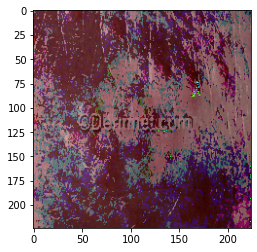

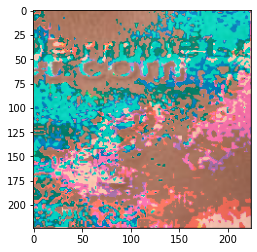

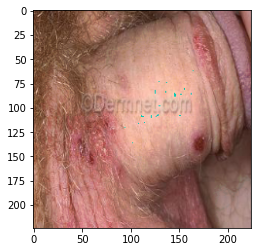

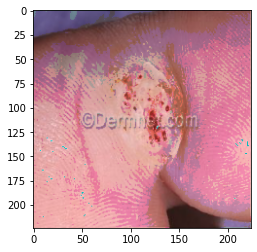

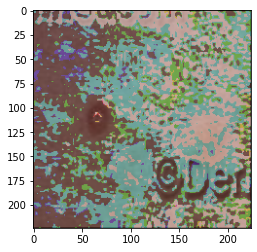

...

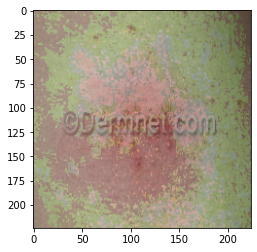

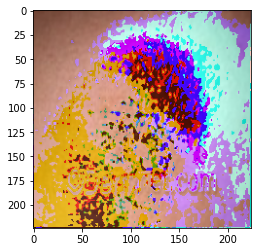

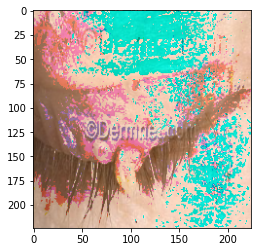

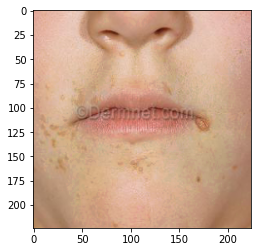

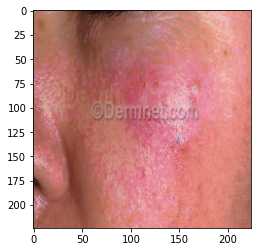

In [17]:
ix = 0
for i in range(100):
    plt.imshow(x_train[len(x_train) - 1 - i])
    plt.show()

In [33]:
model.save_weights('./models/july2_uncropped.keras')

In [35]:
model.evaluate([valid_orig] , y_test)

70/70 [==============================] - 14s 202ms/step - loss: 1.9107 - top_1_accuracy: 0.4600 - top_2_accuracy: 0.5919 - top_3_accuracy: 0.6728 - top_4_accuracy: 0.7354 - top_5_accuracy: 0.7819


[1.9106605052947998,
 0.45999106764793396,
 0.5918641090393066,
 0.6727760434150696,
 0.7353598475456238,
 0.7818506956100464]